# **1. Perkenalan Dataset**


###Ship Performance Clustering Dataset
##### Dataset ini merupakan kumpulan data sintetis yang realistis, dirancang untuk merepresentasikan metrik operasional utama dan atribut dari berbagai jenis kapal yang beroperasi di Teluk Guinea. Dataset ini sangat cocok untuk eksplorasi analitik data maritim, termasuk penggunaan algoritma clustering, karena tidak memiliki label atau kelas target.
#####Informasi Dataset:
- Jumlah baris: 2736
- Jumlah kolom: 18
- Tipe data: Kombinasi antara kategorikal dan numerikal
- Bersifat tanpa label (unlabeled)

##### Jika ingin mengecek sumber kagglenya : https://www.kaggle.com/datasets/jeleeladekunlefijabi/ship-performance-clustering-dataset

# **2. Import Library**

Pada tahap ini, Anda perlu mengimpor beberapa pustaka (library) Python yang dibutuhkan untuk analisis data dan pembangunan model machine learning.

In [75]:
import pandas as pd  # Mengimpor pustaka pandas untuk manipulasi dan analisis data
import matplotlib.pyplot as plt  # Mengimpor pustaka matplotlib untuk visualisasi grafik
import seaborn as sns  # Mengimpor seaborn untuk visualisasi yang lebih interaktif dan informatif
import numpy as np  # Mengimpor NumPy untuk operasi numerik

from yellowbrick.cluster import KElbowVisualizer  # Visualisasi metode Elbow untuk memilih jumlah klaster

from sklearn.cluster import KMeans, DBSCAN  # Algoritma clustering
from sklearn.metrics import silhouette_score  # Evaluasi kualitas clustering
from sklearn.decomposition import PCA  # Reduksi dimensi (misal untuk visualisasi PCA)
from sklearn.feature_selection import VarianceThreshold  # Seleksi fitur berdasarkan variansi
from sklearn.model_selection import train_test_split  # Membagi dataset menjadi data latih dan uji
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler, MinMaxScaler  # Encoding & normalisasi fitur

from google.colab import files

# **3. Memuat Dataset**

#####Pada tahap ini, dataset dimuat dari sumber eksternal yang telah diunggah ke GitHub publik. Proses ini dilakukan satu kali di awal untuk memastikan efisiensi dan konsistensi data sepanjang pipeline analisis. Setelah dataset berhasil dimuat, langkah selanjutnya adalah eksplorasi dan pembersihan data tanpa perlu memuat ulang.

In [76]:
# Data csv nya Saya Upload ke Github pribadi (Public).
df=pd.read_csv("https://raw.githubusercontent.com/TokSeKa-uajy/datasetPython/refs/heads/main/dataSetMLPemula/Ship_Performance_Dataset.csv")
df.head()

,Date,Ship_Type,Route_Type,Engine_Type,Maintenance_Status,Speed_Over_Ground_knots,Engine_Power_kW,Distance_Traveled_nm,Draft_meters,Weather_Condition,Cargo_Weight_tons,Operational_Cost_USD,Revenue_per_Voyage_USD,Turnaround_Time_hours,Efficiency_nm_per_kWh,Seasonal_Impact_Score,Weekly_Voyage_Count,Average_Load_Percentage
0,2023-06-04,Container Ship,NaN,Heavy Fuel Oil (HFO),Critical,12.597558,2062.983982,1030.943616,14.132284,Moderate,1959.017882,483832.354540,292183.273104,25.867077,1.455179,1.415653,1,93.769249
1,2023-06-11,Fish Carrier,Short-haul,Steam Turbine,Good,10.387580,1796.057415,1060.486382,14.653083,Rough,162.394712,483388.000509,883765.787360,63.248196,0.290361,0.885648,6,93.895372
2,2023-06-18,Container Ship,Long-haul,Diesel,Fair,20.749747,1648.556685,658.874144,7.199261,Moderate,178.040917,448543.404044,394018.746904,49.418150,0.499595,1.405813,9,96.218244
3,2023-06-25,Bulk Carrier,Transoceanic,Steam Turbine,Fair,21.055102,915.261795,1126.822519,11.789063,Moderate,1737.385346,261349.605449,87551.375175,22.409110,0.702906,1.370704,1,66.193698
4,2023-07-02,Fish Carrier,Transoceanic,Diesel,Fair,13.742777,1089.721803,1445.281159,9.727833,Moderate,260.595103,287718.375160,676121.459632,64.158231,1.331343,0.583383,8,80.008581


# **4. Exploratory Data Analysis (EDA)**

####Tahap ini bertujuan untuk menggali karakteristik dan struktur data secara menyeluruh sebelum dilakukan preprocessing dan pemodelan. EDA mencakup eksplorasi struktur, tipe data, distribusi, relasi antar fitur, serta potensi masalah seperti data hilang atau outlier.
####Dataset yang digunakan terdiri dari 2736 baris dan 18 kolom, dengan kombinasi antara fitur numerik (12) dan kategorikal (5). Satu kolom waktu (Date) diidentifikasi tidak relevan untuk analisis clustering, dan akan dihapus sejak awal.
####Langkah-langkah EDA yang dilakukan meliputi:
#####Memahami Struktur Data : Tinjauan awal terhadap jumlah kolom, tipe data, dan ringkasan statistik menunjukkan bahwa data cukup bervariasi dan tidak terdapat outlier yang merusak. Fitur numerik seperti Revenue_per_Voyage_USD memiliki skala besar namun tetap konsisten, sedangkan Efficiency_nm_per_kWh menunjukkan sebaran efisiensi yang realistis.
##### Menangani Data yang Hilang : Ditemukan missing values pada lima fitur kategorikal, masing-masing sebanyak 136 entri. Seluruhnya akan diisi menggunakan nilai modus sebagai pendekatan standar untuk tipe data kategorikal. Tidak ditemukan data duplikat, sehingga tidak perlu dilakukan pembersihan tambahan.
##### Analisis Distribusi dan Korelasi : Distribusi fitur numerik divisualisasikan dengan histogram dan KDE, menunjukkan sebaran data yang stabil dan cukup simetris, tanpa pencilan signifikan. Fitur-fitur kategorikal memiliki distribusi yang relatif seimbang, yang baik untuk keperluan clustering. Korelasi antar fitur numerik dihitung menggunakan Pearson dan divisualisasikan dalam heatmap dan pairplot, menunjukkan bahwa tidak ada hubungan linier kuat di antara fitur—artinya setiap fitur menyumbang informasi unik yang bermanfaat untuk segmentasi data.
##### Visualisasi Data : Visualisasi scatter dan heatmap memperkuat temuan bahwa hubungan antar fitur cenderung lemah. Meskipun demikian, hal ini membuka peluang untuk eksplorasi struktur klaster non-linier, karena tidak adanya kolinearitas berarti model clustering dapat bekerja lebih efektif di ruang multidimensi tanpa bias tertentu.

#####Melalui EDA ini, dapat disimpulkan bahwa dataset memiliki kualitas yang baik, bervariasi namun stabil, dan siap untuk diproses lebih lanjut menggunakan metode clustering seperti KMeans.

###Memahami Struktur Data
##### Dataset ini terdiri dari 2736 baris dan 18 kolom, yang mencakup kombinasi data numerik dan kategorikal. Namun, kolom Date dinyatakan tidak relevan untuk analisis clustering, sehingga akan dihapus. Setelah penghapusan, analisis dilanjutkan pada 17 kolom.
####Jenis Data:
- Numerikal (12 kolom):
#####Termasuk fitur seperti Speed_Over_Ground_knots, Engine_Power_kW, Distance_Traveled_nm, Cargo_Weight_tons, hingga Weekly_Voyage_Count. Tipe data umumnya float64 dan int64.
- Kategorikal (5 kolom):
#####Kolom seperti Ship_Type, Route_Type, Engine_Type, Maintenance_Status, dan Weather_Condition bertipe object. Nantinya fitur-fitur ini perlu di-encode sebelum dimasukkan ke algoritma clustering.

In [77]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2736 entries, 0 to 2735
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Date                     2736 non-null   object 
 1   Ship_Type                2600 non-null   object 
 2   Route_Type               2600 non-null   object 
 3   Engine_Type              2600 non-null   object 
 4   Maintenance_Status       2600 non-null   object 
 5   Speed_Over_Ground_knots  2736 non-null   float64
 6   Engine_Power_kW          2736 non-null   float64
 7   Distance_Traveled_nm     2736 non-null   float64
 8   Draft_meters             2736 non-null   float64
 9   Weather_Condition        2600 non-null   object 
 10  Cargo_Weight_tons        2736 non-null   float64
 11  Operational_Cost_USD     2736 non-null   float64
 12  Revenue_per_Voyage_USD   2736 non-null   float64
 13  Turnaround_Time_hours    2736 non-null   float64
 14  Efficiency_nm_per_kWh   

####Dari df.describe(), dapat disimpulkan:
#####Skala nilai bervariasi luas, contoh:
- Revenue_per_Voyage_USD berkisar antara ~50 ribu hingga ~1 juta USD.
- Efficiency_nm_per_kWh berada di antara 0.1 hingga 1.5, cukup normal untuk skor efisiensi.

#####Tidak tampak outlier ekstrim yang merusak, karena distribusinya masih berada dalam rentang yang masuk akal secara domain (maritim/kapal).
#####Nilai rata-rata dan median (50%) pada fitur numerik seperti Speed_Over_Ground_knots atau Turnaround_Time_hours relatif dekat, menandakan sebaran data tidak terlalu skewed.
######Ada missing values pada kelima fitur kategorikal, masing-masing kehilangan 136 nilai:
- Ship_Type
- Route_Type
- Engine_Type
- Maintenance_Status
- Weather_Condition

#####Ini perlu ditangani saat preprocessing


In [78]:
df.describe()

,Speed_Over_Ground_knots,Engine_Power_kW,Distance_Traveled_nm,Draft_meters,Cargo_Weight_tons,Operational_Cost_USD,Revenue_per_Voyage_USD,Turnaround_Time_hours,Efficiency_nm_per_kWh,Seasonal_Impact_Score,Weekly_Voyage_Count,Average_Load_Percentage
count,2736.000000,2736.000000,2736.000000,2736.000000,2736.000000,2736.000000,2736.000000,2736.000000,2736.000000,2736.000000,2736.000000,2736.000000
mean,17.602863,1757.610939,1036.406203,9.929103,1032.573264,255143.344488,521362.062011,41.747536,0.798656,1.003816,4.914839,75.219222
std,4.311979,717.002777,568.632080,2.876423,558.697499,140890.482189,271211.625499,17.633130,0.403590,0.288251,2.597647,14.510168
min,10.009756,501.025220,50.433150,5.001947,50.229624,10092.306318,50351.814447,12.019909,0.100211,0.500004,1.000000,50.012005
25%,13.928452,1148.104914,548.511573,7.437485,553.983629,131293.378767,290346.388017,26.173537,0.463592,0.758033,3.000000,62.703724
50%,17.713757,1757.494344,1037.816060,9.918965,1043.207497,257157.653226,520176.931762,41.585188,0.789877,1.009009,5.000000,75.504709
75%,21.284785,2382.594292,1540.934161,12.413149,1527.722391,381796.930499,750072.791216,57.363922,1.147426,1.252808,7.000000,87.721205
max,24.997043,2998.734329,1998.337057,14.992947,1999.126697,499734.867868,999916.696140,71.972415,1.499259,1.499224,9.000000,99.999643


###Menangani Data yang Hilang
#####Berdasarkan hasil df.isna().sum(), terdapat lima fitur kategorikal yang memiliki nilai hilang sebanyak 136 entri masing-masing:
- Ship_Type
- Route_Type
- Engine_Type
- Maintenance_Status
- Weather_Condition

#####Karena semua fitur tersebut bersifat kategorikal, pendekatan yang dipilih adalah mengisi nilai yang hilang menggunakan modus (nilai yang paling sering muncul). Ini merupakan strategi umum dan efektif untuk data kategorikal, terutama ketika proporsi missing value relatif kecil (sekitar 5%).

In [79]:
df.isna().sum()

,0
Date,0
Ship_Type,136
Route_Type,136
Engine_Type,136
Maintenance_Status,136
Speed_Over_Ground_knots,0
Engine_Power_kW,0
Distance_Traveled_nm,0
Draft_meters,0
Weather_Condition,136


#####Pemeriksaan menggunakan df.duplicated().sum() menunjukkan bahwa tidak ada baris duplikat di dalam dataset. Artinya, data sudah unik dan tidak perlu dilakukan pembersihan tambahan terkait duplikasi.

In [80]:
df.duplicated().sum()

np.int64(0)

###Analisis Distribusi dan Korelasi
#####Visualisasi histogram menunjukkan bahwa sebagian besar variabel numerik dalam dataset memiliki distribusi yang relatif merata dan simetris, tanpa adanya lonjakan tajam atau pencilan ekstrem.
- Speed_Over_Ground_knots, Engine_Power_kW, dan Distance_Traveled_nm memiliki distribusi yang mendekati normal, meskipun sedikit datar, menandakan keragaman yang sehat pada data operasional kapal.
- Operational_Cost_USD dan Revenue_per_Voyage_USD sedikit condong ke kanan (right-skewed), yang wajar karena distribusi biaya dan pendapatan cenderung tidak simetris di dunia nyata.
- Efficiency_nm_per_kWh dan Average_Load_Percentage juga terdistribusi cukup luas, dengan pola yang konsisten dan tanpa outlier besar.

#####Distribusi yang merata dan minim pencilan ekstrem mengindikasikan bahwa data ini stabil, seragam, dan kemungkinan merupakan data sintetis yang telah dirancang untuk mencerminkan variasi realistis. Oleh karena itu, data ini siap digunakan dalam pemodelan tanpa perlakuan ekstrem terhadap outlier.

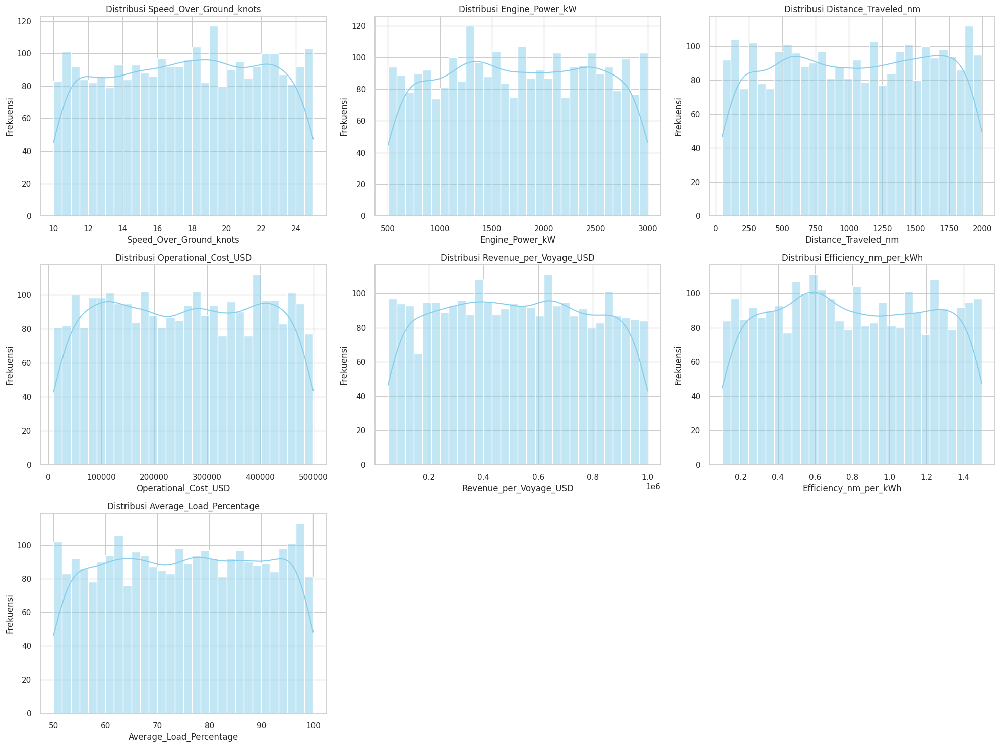

In [81]:
fitur_numerik = [
    'Speed_Over_Ground_knots',
    'Engine_Power_kW',
    'Distance_Traveled_nm',
    'Operational_Cost_USD',
    'Revenue_per_Voyage_USD',
    'Efficiency_nm_per_kWh',
    'Average_Load_Percentage'
]
# Set style
sns.set(style="whitegrid")

# Atur ukuran grid visualisasi
plt.figure(figsize=(20, 15))

# Loop untuk setiap fitur
for i, col in enumerate(fitur_numerik, 1):
    plt.subplot(3, 3, i)  # baris 3 kolom 3, tergantung jumlah fitur
    sns.histplot(df[col], kde=True, bins=30, color='skyblue')
    plt.title(f'Distribusi {col}', fontsize=12)
    plt.xlabel(col)
    plt.ylabel('Frekuensi')

plt.tight_layout()
plt.show()


#####Visualisasi countplot digunakan untuk memahami seberapa merata distribusi masing-masing kategori dalam fitur-fitur kategorikal. Hasilnya menunjukkan bahwa tidak ada dominasi ekstrem dari satu kategori, sehingga dataset memiliki keragaman yang baik untuk keperluan clustering.
#####Detail Per Fitur:
- Ship_Type: Dataset mencakup empat jenis kapal dengan distribusi yang cukup merata. Bulk Carrier memiliki jumlah terbanyak, namun tidak jauh berbeda dengan tiga jenis lainnya.
- Route_Type: Long-haul sedikit mendominasi, tetapi proporsi Short-haul, Transoceanic, dan Coastal tetap signifikan. Hal ini mengindikasikan cakupan rute pelayaran yang beragam.
- Engine_Type: Diesel merupakan jenis mesin terbanyak, diikuti oleh Steam Turbine dan Heavy Fuel Oil (HFO). Distribusi ini mencerminkan variasi teknologi mesin kapal dalam operasi nyata.
- Maintenance_Status: Status Good paling banyak muncul, menandakan sebagian besar kapal berada dalam kondisi optimal. Namun, data juga mencakup kondisi Fair dan Critical, yang penting untuk analisis performa.
- Weather_Condition: Calm paling sering terjadi, diikuti Moderate, dan Rough. Ini logis mengingat pelayaran cenderung dioptimalkan saat cuaca baik.

#####Keragaman kategori yang merata di seluruh fitur menunjukkan bahwa model clustering memiliki peluang besar untuk mendeteksi pola yang relevan dari berbagai kombinasi kategori. Tidak diperlukan balancing data pada tahap ini.

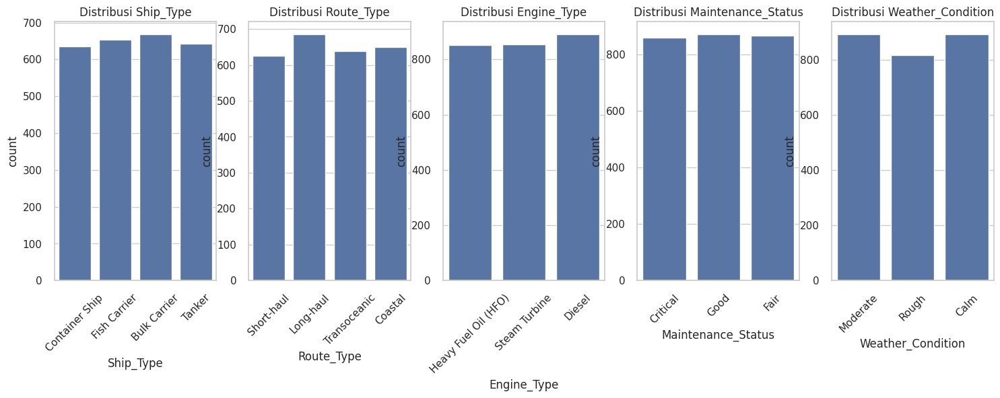

In [82]:
fitur_kategorikal = [
    'Ship_Type',
    'Route_Type',
    'Engine_Type',
    'Maintenance_Status',
    'Weather_Condition'
]

# Atur gaya plot
sns.set(style="whitegrid")

# Buat grid plot
plt.figure(figsize=(18, 5))

# Loop setiap fitur kategorikal
for i, col in enumerate(fitur_kategorikal, 1):
    plt.subplot(1, 5, i)
    sns.countplot(data=df, x=col)
    plt.title(f'Distribusi {col}')
    plt.xticks(rotation=45)


###Visualisasi Data
####Heatmap korelasi digunakan untuk memahami hubungan linier antar fitur numerik. Korelasi dihitung berdasarkan koefisien Pearson, dengan nilai antara -1 (negatif sempurna) hingga +1 (positif sempurna).
#####Sebagian besar pasangan fitur menunjukkan korelasi sangat lemah (di bawah 0.1), mengindikasikan bahwa tidak ada hubungan linier yang kuat di antara fitur-fitur tersebut.
#####Korelasi tertinggi pun hanya berada di kisaran ~0.04 hingga ~0.05, misalnya antara:
- Distance_Traveled_nm dengan Weekly_Voyage_Count (0.044)
- Average_Load_Percentage dengan Engine_Power_kW (0.024)

#####Tidak ditemukan fitur yang redundan atau berkolinear tinggi, sehingga semua fitur dapat dipertimbangkan untuk dianalisis lebih lanjut tanpa perlu dieliminasi lebih awal karena korelasi.

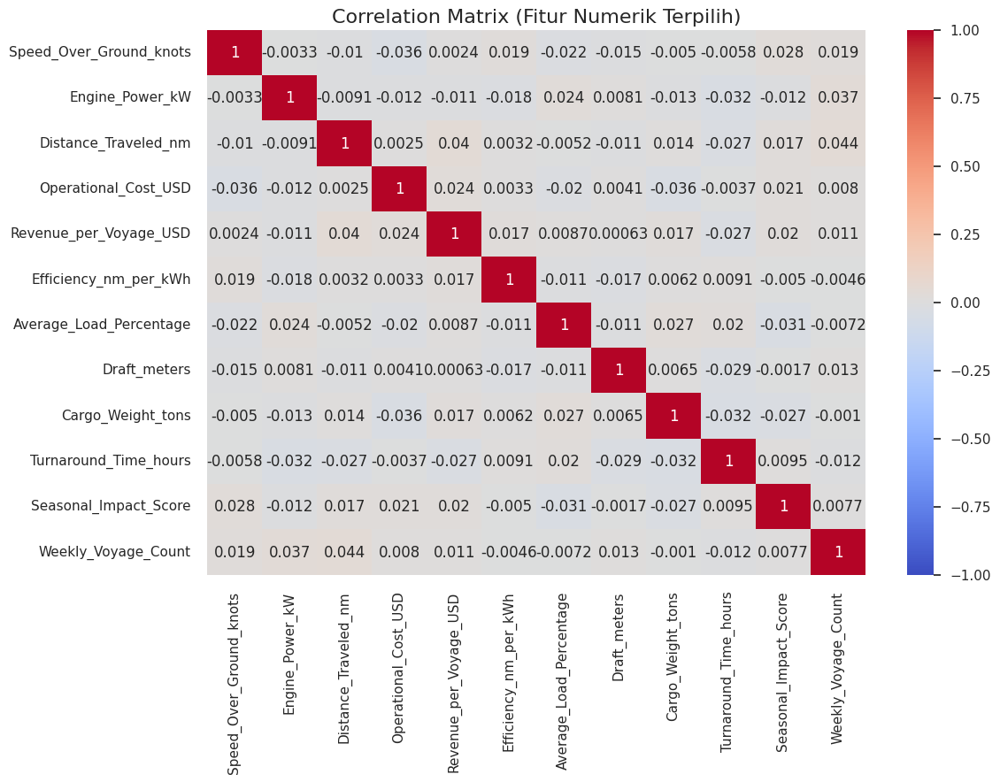

In [83]:
fitur_numerik = [
    'Speed_Over_Ground_knots',
    'Engine_Power_kW',
    'Distance_Traveled_nm',
    'Operational_Cost_USD',
    'Revenue_per_Voyage_USD',
    'Efficiency_nm_per_kWh',
    'Average_Load_Percentage',
    'Draft_meters',
    'Cargo_Weight_tons',
    'Turnaround_Time_hours',
    'Seasonal_Impact_Score',
    'Weekly_Voyage_Count'
]

# Hitung korelasi
correlation_matrix = df[fitur_numerik].corr()

# Plot heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Matrix (Fitur Numerik Terpilih)', fontsize=16)
plt.show()


#####Untuk melengkapi analisis korelasi secara visual, digunakan pairplot dari pustaka Seaborn. Pairplot ini menampilkan scatter plot untuk setiap pasangan fitur numerik, dan histogram di diagonal untuk distribusi masing-masing fitur.
#####Pairplot menunjukkan bahwa hubungan antar fitur numerik bersifat lemah hingga tidak ada. Namun, hal ini bukan kelemahan, justru memperkuat potensi clustering berbasis struktur multi-dimensi kompleks yang tidak linier. Ini membuka peluang untuk menggunakan metode unsupervised seperti KMeans yang bekerja baik pada data berdimensi tinggi tanpa asumsi korelasi antar fitur.

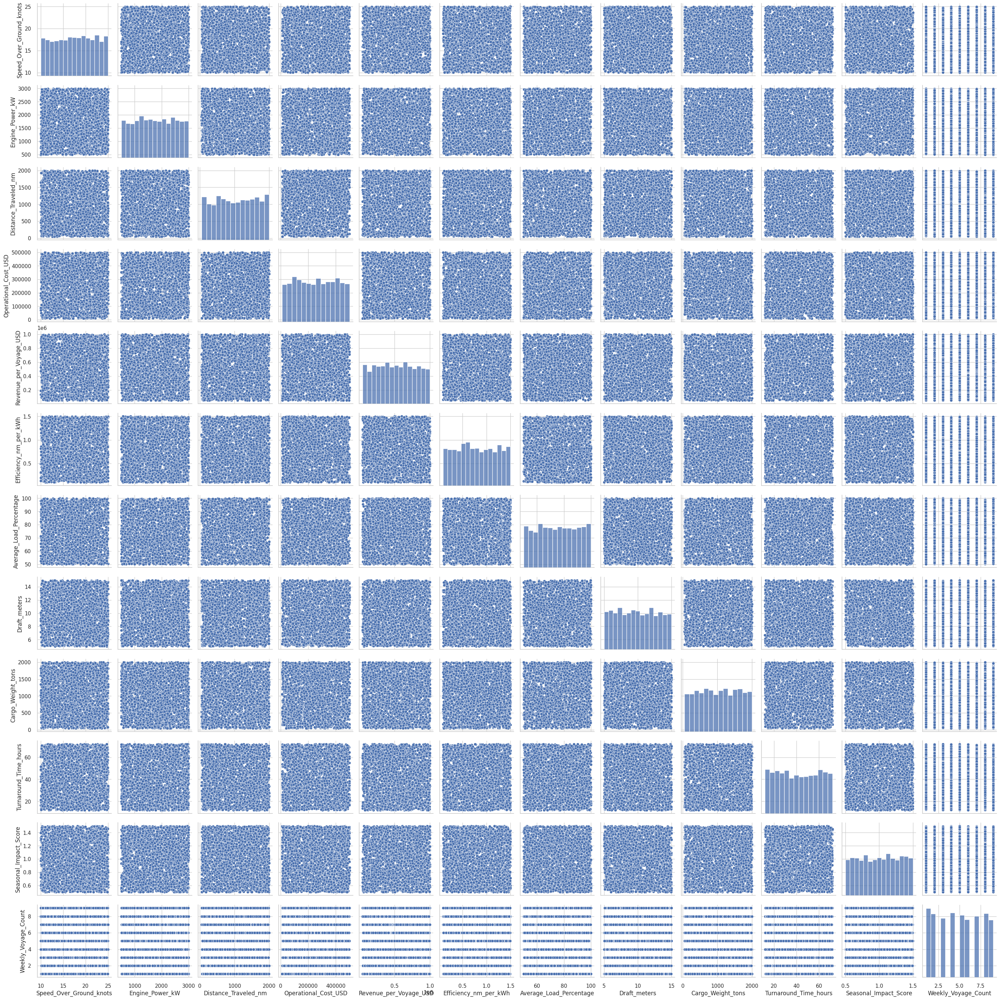

In [84]:
# Pairplot untuk fitur numerik
sns.pairplot( df[fitur_numerik])
plt.show()

# **5. Data Preprocessing**

####Memilih kolom yang relevan
#####Pada tahap ini, hanya fitur-fitur yang telah dipilih dan dianggap relevan yang akan digunakan untuk pemodelan. Fitur tersebut mencakup gabungan dari:
- Fitur numerik (fitur_numerik)
- Fitur kategorikal (fitur_kategorikal)

##### Untuk menyederhanakan DataFrame, kolom-kolom yang tidak termasuk dalam daftar fitur terpilih akan dibuang. Pendekatan ini memiliki efek yang sama seperti drop() kolom satu per satu, tetapi jauh lebih ringkas dan bersih.

In [85]:
# Gabungkan fitur numerik dan kategorikal yang dipilih
fitur_dipakai = fitur_numerik + fitur_kategorikal

# Pilih yang diperlukan aja
df = df[fitur_dipakai]
df.head()

,Speed_Over_Ground_knots,Engine_Power_kW,Distance_Traveled_nm,Operational_Cost_USD,Revenue_per_Voyage_USD,Efficiency_nm_per_kWh,Average_Load_Percentage,Draft_meters,Cargo_Weight_tons,Turnaround_Time_hours,Seasonal_Impact_Score,Weekly_Voyage_Count,Ship_Type,Route_Type,Engine_Type,Maintenance_Status,Weather_Condition
0,12.597558,2062.983982,1030.943616,483832.354540,292183.273104,1.455179,93.769249,14.132284,1959.017882,25.867077,1.415653,1,Container Ship,NaN,Heavy Fuel Oil (HFO),Critical,Moderate
1,10.387580,1796.057415,1060.486382,483388.000509,883765.787360,0.290361,93.895372,14.653083,162.394712,63.248196,0.885648,6,Fish Carrier,Short-haul,Steam Turbine,Good,Rough
2,20.749747,1648.556685,658.874144,448543.404044,394018.746904,0.499595,96.218244,7.199261,178.040917,49.418150,1.405813,9,Container Ship,Long-haul,Diesel,Fair,Moderate
3,21.055102,915.261795,1126.822519,261349.605449,87551.375175,0.702906,66.193698,11.789063,1737.385346,22.409110,1.370704,1,Bulk Carrier,Transoceanic,Steam Turbine,Fair,Moderate
4,13.742777,1089.721803,1445.281159,287718.375160,676121.459632,1.331343,80.008581,9.727833,260.595103,64.158231,0.583383,8,Fish Carrier,Transoceanic,Diesel,Fair,Moderate


####Mengisi data kosong
#####Karena kelima fitur tersebut bertipe kategorikal, pendekatan yang digunakan adalah mengisi nilai kosong dengan nilai modus, yaitu nilai yang paling sering muncul dalam masing-masing kolom. Pendekatan ini dianggap paling tepat karena:
- Modus mewakili kategori yang paling umum dan wajar dalam kolom tersebut.
- Tidak memperkenalkan nilai baru yang tidak konsisten.
- ocok digunakan saat proporsi data hilang kecil, seperti pada dataset ini (~5%).

#####Kode ini membuat dictionary fill_dict berisi pasangan kolom dan nilai modusnya, lalu digunakan untuk mengisi seluruh nilai kosong di kolom tersebut secara langsung (in-place).
#####Setelah proses ini, seluruh missing value di fitur kategorikal telah diisi tanpa menghapus baris data apa pun, sehingga integritas data tetap terjaga dan dataset siap untuk tahap preprocessing selanjutnya seperti encoding dan normalisasi.

In [86]:
fill_dict = {
    col: df[col].mode()[0]
    for col in ['Ship_Type', 'Route_Type', 'Engine_Type', 'Maintenance_Status', 'Weather_Condition']
}
df.fillna(fill_dict, inplace=True)

####Normalisasi dan Encoding Data
#####Pada tahap ini dilakukan persiapan akhir data sebelum modeling:
- Fitur numerik dinormalisasi ke rentang [0, 1] menggunakan MinMaxScaler agar perhitungan jarak pada algoritma clustering tidak bias terhadap skala.
- Fitur kategorikal diubah menjadi format numerik dengan LabelEncoder, agar bisa diproses oleh model.
- Hasil transformasi disalin ke df_final sebagai dataset akhir yang siap digunakan.

In [87]:
# 1. Normalisasi fitur numerik
scaler = MinMaxScaler()
df_scaled = df.copy()
df_scaled[fitur_numerik] = scaler.fit_transform(df[fitur_numerik])

# 2. Encoding fitur kategorikal
label_encoders = {}
for col in fitur_kategorikal:
    le = LabelEncoder()
    df_scaled[col] = le.fit_transform(df_scaled[col])
    label_encoders[col] = le  # Simpan encoder untuk inverse nanti

# 3. Hasil akhir
df_final = df_scaled.copy()

# Cek hasil
df_final.head()

,Speed_Over_Ground_knots,Engine_Power_kW,Distance_Traveled_nm,Operational_Cost_USD,Revenue_per_Voyage_USD,Efficiency_nm_per_kWh,Average_Load_Percentage,Draft_meters,Cargo_Weight_tons,Turnaround_Time_hours,Seasonal_Impact_Score,Weekly_Voyage_Count,Ship_Type,Route_Type,Engine_Type,Maintenance_Status,Weather_Condition
0,0.172666,0.625357,0.503367,0.967522,0.254676,0.968493,0.875361,0.913856,0.979420,0.230969,0.916364,0.000,1,1,1,0,1
1,0.025210,0.518488,0.518533,0.966615,0.877680,0.135914,0.877884,0.965983,0.057553,0.854481,0.385945,0.625,2,2,2,2,2
2,0.716607,0.459434,0.312357,0.895451,0.361920,0.285468,0.924353,0.219929,0.065581,0.623798,0.906517,1.000,1,1,0,1,1
3,0.736981,0.165847,0.552589,0.513144,0.039175,0.430789,0.323714,0.679323,0.865698,0.173291,0.871380,0.000,0,3,2,1,1
4,0.249079,0.235695,0.716076,0.566997,0.659007,0.879978,0.600080,0.473014,0.107941,0.869660,0.083444,0.875,2,3,0,1,1


# **6. Pembangunan Model Clustering**

## **a. Pembangunan Model Clustering**

Pada tahap ini, Anda membangun model clustering dengan memilih algoritma yang sesuai untuk mengelompokkan data berdasarkan kesamaan. Berikut adalah **rekomendasi** tahapannya.
1. Pilih algoritma clustering yang sesuai.
2. Latih model dengan data menggunakan algoritma tersebut.

###Pelatihan Model KMeans
####Pada tahap ini, dilakukan pelatihan model clustering menggunakan KMeans dengan jumlah klaster (k) sebanyak 2. Model dilatih menggunakan seluruh fitur yang telah dinormalisasi dan diencoding di df_final.
####Setelah pelatihan, label klaster ditambahkan ke dataset dan dilakukan analisis sederhana terhadap karakteristik masing-masing klaster.

####Hasil:
######Rata-rata dari berbagai fitur (speed, power, cost, dll.) pada kedua klaster hampir identik, dan nilai dominan kategori (Ship_Type) juga sama. Hal ini menunjukkan bahwa model belum mampu memisahkan data menjadi kelompok yang bermakna, kemungkinan karena distribusi data yang terlalu seragam atau tidak adanya pola yang jelas dalam ruang fitur.

In [88]:
# X adalah data akhir tanpa kolom 'cluster'
X = df_final.copy()

# Tentukan jumlah cluster
k = 2

# Latih ulang model
kmeans = KMeans(n_clusters=k, random_state=42)
kmeans.fit(X)

# Ambil label
labels = kmeans.labels_

# Buat salinan df_final (tanpa cluster), lalu tambahkan label
X_with_labelsShow = df_final.copy()
X_with_labelsShow['cluster'] = labels

# Analisis isi masing-masing cluster
def analyze_clusters(X, k):
    print("Analisis Karakteristik Setiap Cluster:")
    for cluster_id in range(k):
        cluster_data = X[X['cluster'] == cluster_id]

        # Hitung rata-rata dari fitur numerik
        mean_speed = cluster_data['Speed_Over_Ground_knots'].mean()
        mean_power = cluster_data['Engine_Power_kW'].mean()
        mean_eff = cluster_data['Efficiency_nm_per_kWh'].mean()
        mean_cost = cluster_data['Operational_Cost_USD'].mean()
        mode_ship = cluster_data['Ship_Type'].mode()[0]  # sudah label encoded

        print(f"\nCluster {cluster_id + 1}:")
        print(f"Rata-rata Speed (knots): {mean_speed:.2f}")
        print(f"Rata-rata Power (kW)   : {mean_power:.2f}")
        print(f"Rata-rata Efficiency   : {mean_eff:.2f}")
        print(f"Rata-rata Cost (USD)   : {mean_cost:,.2f}")
        print(f"Dominan Ship Type (encoded): {mode_ship}")

analyze_clusters(X_with_labelsShow, k)


Analisis Karakteristik Setiap Cluster:

Cluster 1:
Rata-rata Speed (knots): 0.51
Rata-rata Power (kW)   : 0.50
Rata-rata Efficiency   : 0.50
Rata-rata Cost (USD)   : 0.51
Dominan Ship Type (encoded): 0

Cluster 2:
Rata-rata Speed (knots): 0.50
Rata-rata Power (kW)   : 0.50
Rata-rata Efficiency   : 0.50
Rata-rata Cost (USD)   : 0.49
Dominan Ship Type (encoded): 0


###Visualisasi Klaster (Percobaan KMeans)
####Visualisasi ini menggunakan dua fitur (Efficiency_nm_per_kWh dan Average_Load_Percentage) untuk melihat hasil clustering dari KMeans.
- Titik-titik mewakili data kapal, diwarnai berdasarkan klaster.
- Titik besar merah (X) menunjukkan posisi centroid.

####Klaster terlihat tumpang tindih dan centroid sangat dekat, menandakan pemisahan antar klaster belum optimal. Ini hanya percobaan awal untuk mengevaluasi performa KMeans secara visual.

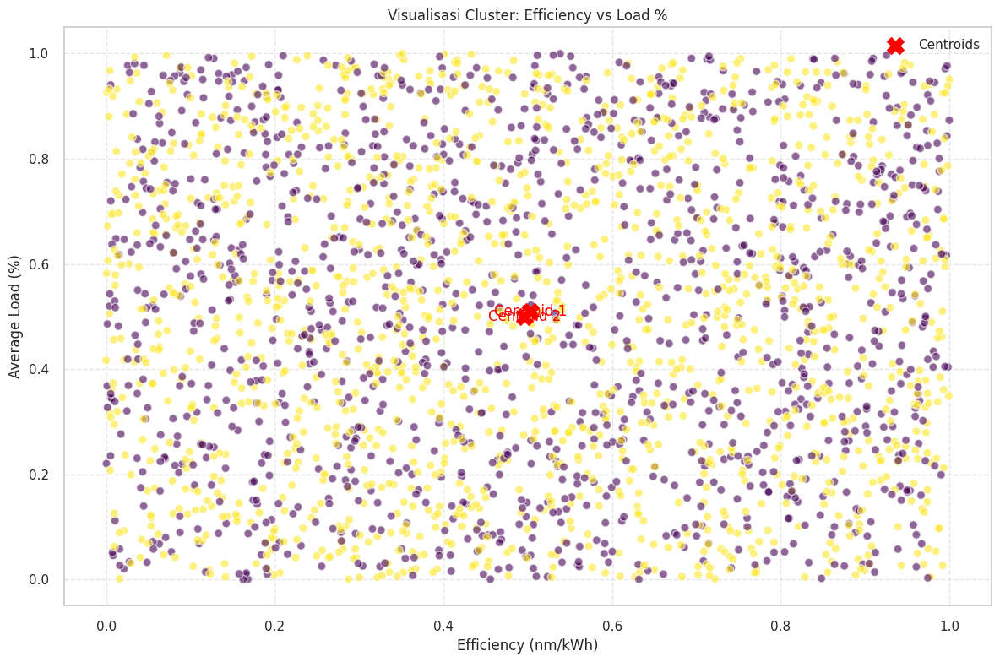

In [89]:
# Ambil posisi centroid
centroids = kmeans.cluster_centers_

# Visualisasi klaster: pakai dua fitur representatif
plt.figure(figsize=(12, 8))
plt.scatter(
    X['Efficiency_nm_per_kWh'],
    X['Average_Load_Percentage'],
    c=labels,
    cmap='viridis',
    s=50,
    alpha=0.6,
    edgecolors='w',
    marker='o'
)

# Plot centroid
plt.scatter(
    centroids[:, X.columns.get_loc('Efficiency_nm_per_kWh')],
    centroids[:, X.columns.get_loc('Average_Load_Percentage')],
    c='red',
    s=200,
    marker='X',
    label='Centroids'
)

# Tambahkan label
for i in range(k):
    x_c = centroids[i, X.columns.get_loc('Efficiency_nm_per_kWh')]
    y_c = centroids[i, X.columns.get_loc('Average_Load_Percentage')]
    plt.text(x_c, y_c, f'Centroid {i+1}', color='red', fontsize=12, ha='center', va='center')

# Label
plt.title('Visualisasi Cluster: Efficiency vs Load %')
plt.xlabel('Efficiency (nm/kWh)')
plt.ylabel('Average Load (%)')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


## **b. Evaluasi Model Clustering**

Untuk menentukan jumlah cluster yang optimal dalam model clustering, Anda dapat menggunakan metode Elbow atau Silhouette Score.

Metode ini membantu kita menemukan jumlah cluster yang memberikan pemisahan terbaik antar kelompok data, sehingga model yang dibangun dapat lebih efektif. Berikut adalah **rekomendasi** tahapannya.
1. Gunakan Silhouette Score dan Elbow Method untuk menentukan jumlah cluster optimal.
2. Hitung Silhouette Score sebagai ukuran kualitas cluster.

###Menentukan Jumlah Cluster Optimal (Silhouette Method)
####Untuk menentukan jumlah klaster terbaik, digunakan KElbowVisualizer dari pustaka Yellowbrick dengan metrik Silhouette Score. Nilai Silhouette mengukur seberapa baik setiap titik cocok dengan klasternya sendiri dibanding klaster lain, makin tinggi, makin baik.
#### Hasil Visualisasi:
- Nilai tertinggi diperoleh saat k = 2 dengan score sekitar 0.159, meskipun nilainya masih sangat rendah.
- Ini mengindikasikan bahwa struktur klaster dalam data kurang jelas, tapi k = 2 tetap menjadi pilihan terbaik dari opsi yang ada.

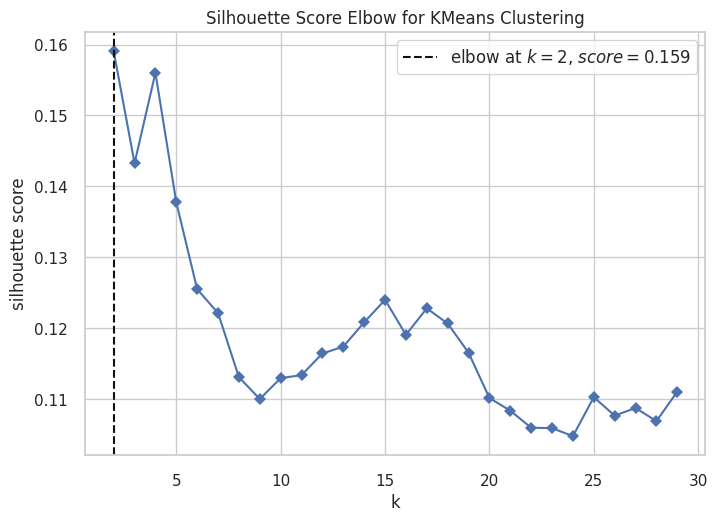

<Axes: title={'center': 'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [90]:
# Inisialisasi model dan visualizer
visualizer = KElbowVisualizer(kmeans, k=(2, 30), metric='silhouette', timings=False)

# Fit & show
visualizer.fit(X)
visualizer.show()

## **c. Feature Selection (Opsional)**

Silakan lakukan feature selection jika Anda membutuhkan optimasi model clustering. Jika Anda menerapkan proses ini, silakan lakukan pemodelan dan evaluasi kembali menggunakan kolom-kolom hasil feature selection. Terakhir, bandingkan hasil performa model sebelum dan sesudah menerapkan feature selection.

###Feature Selection & Reduksi Dimensi (PCA)
####Untuk menyederhanakan data dan fokus pada fitur yang paling relevan, dilakukan dua langkah utama:
1. Feature Selection : Menghapus fitur dengan varians sangat kecil (nyaris tidak berubah antar baris), karena fitur seperti ini biasanya tidak memberikan kontribusi signifikan dalam proses clustering.
2. PCA (Principal Component Analysis) : Setelah fitur dipilih, data direduksi menjadi hanya 2 dimensi utama menggunakan PCA. Tujuannya adalah untuk
- Menyederhanakan kompleksitas data
- Memudahkan proses visualisasi klaster
- Memungkinkan pemodelan ulang dengan data yang lebih padat informasi

####Hasil akhir disimpan dalam df_pca yang berisi dua kolom utama: PC1 dan PC2 — yaitu kombinasi linier dari fitur-fitur yang paling informatif.


In [91]:
# Feature Selection: hapus fitur dengan varians sangat kecil
selector = VarianceThreshold(threshold=0.001)
X_selected = selector.fit_transform(df_final)
selected_features = df_final.columns[selector.get_support()].tolist()
print(f"Fitur yang dipilih: {selected_features}")

# PCA: reduksi ke 2 dimensi untuk clustering & visualisasi
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_selected)

# Simpan sebagai DataFrame agar lebih mudah divisualisasikan
df_pca = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])


Fitur yang dipilih: ['Speed_Over_Ground_knots', 'Engine_Power_kW', 'Distance_Traveled_nm', 'Operational_Cost_USD', 'Revenue_per_Voyage_USD', 'Efficiency_nm_per_kWh', 'Average_Load_Percentage', 'Draft_meters', 'Cargo_Weight_tons', 'Turnaround_Time_hours', 'Seasonal_Impact_Score', 'Weekly_Voyage_Count', 'Ship_Type', 'Route_Type', 'Engine_Type', 'Maintenance_Status', 'Weather_Condition']


###Evaluasi Clustering Setelah PCA
####Setelah dilakukan feature selection dan reduksi dimensi (PCA ke 2D), model KMeans dilatih ulang dengan k = 16. Hasil evaluasi: Silhouette Score setelah PCA: 0.9118
####Sebagai perbandingan: Sebelum PCA (k = 2): 0.159
####PCA membantu meningkatkan kualitas klaster secara signifikan, dari pemisahan yang lemah menjadi struktur klaster yang lebih jelas dan terdefinisi.



In [92]:
# Clustering dengan KMeans di ruang PCA
kmeans = KMeans(n_clusters=16, random_state=0)
kmeans.fit(df_pca)
labels = kmeans.labels_
centroids = kmeans.cluster_centers_

# Evaluasi kualitas cluster
score = silhouette_score(df_pca, labels)
print(f"Silhouette Score setelah PCA (2D): {score:.4f}")

Silhouette Score setelah PCA (2D): 0.9118


## **d. Visualisasi Hasil Clustering**

####Setelah menentukan jumlah klaster dan melakukan pelatihan model, hasil clustering divisualisasikan dalam ruang dua dimensi hasil reduksi PCA (PC1 vs PC2).
- Setiap titik mewakili satu data, diberi warna sesuai klaster.
- Titik X merah menunjukkan posisi centroid masing-masing klaster.
- Label “Centroid 1”, “Centroid 2”, dst. ditambahkan agar memudahkan interpretasi.

####Tujuan: Untuk melihat sejauh mana data terbagi ke dalam klaster yang terpisah dan bagaimana posisi centroid sebagai pusat masing-masing kelompok.
####Hasil ini memperkuat validitas klaster setelah PCA, karena titik-titik tampak terkonsentrasi di sekitar centroid masing-masing.

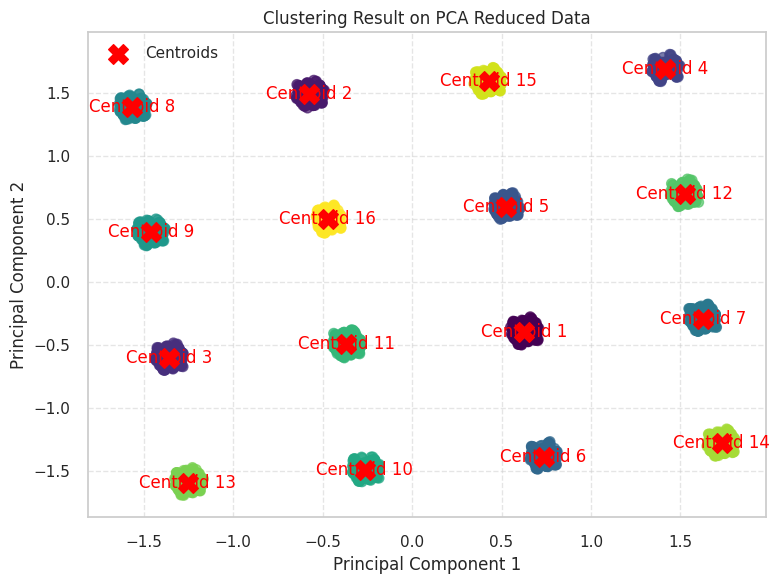

In [93]:
# Visualisasi cluster hasil KMeans
plt.figure(figsize=(8, 6))
plt.scatter(df_pca['PC1'], df_pca['PC2'], c=labels, cmap='viridis', s=50, alpha=0.7)
plt.scatter(centroids[:, 0], centroids[:, 1],
            c='red', s=200, marker='X', label='Centroids')

# Tambahkan label centroid
for i, centroid in enumerate(centroids):
    plt.text(
        centroid[0], centroid[1],
        f'Centroid {i+1}',
        color='red',
        fontsize=12,
        ha='center',
        va='center'
    )

plt.title('Clustering Result on PCA Reduced Data')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

## **e. Analisis dan Interpretasi Hasil Cluster**

### Interpretasi Target

**Tutorial: Melakukan Inverse Transform pada Data Target Setelah Clustering**

Setelah melakukan clustering dengan model **KMeans**, kita perlu mengembalikan data yang telah diubah (normalisasi, standarisasi, atau label encoding) ke bentuk aslinya. Berikut adalah langkah-langkahnya.



**1. Tambahkan Hasil Label Cluster ke DataFrame**
Setelah mendapatkan hasil clustering, kita tambahkan label cluster ke dalam DataFrame yang telah dinormalisasi.

```python
df_normalized['Cluster'] = model_kmeans.labels_
```

Lakukan Inverse Transform pada feature yang sudah dilakukan Labelisasi dan Standararisasi. Berikut code untuk melakukannya:
label_encoder.inverse_transform(X_Selected[['Fitur']])

Lalu masukkan ke dalam kolom dataset asli atau membuat dataframe baru
```python
df_normalized['Fitur'] = label_encoder.inverse_transform(df_normalized[['Fitur']])
```
Masukkan Data yang Sudah Di-Inverse ke dalam Dataset Asli atau Buat DataFrame Baru
```python
df_original['Fitur'] = df_normalized['Fitur']
```

In [94]:
df_final['Cluster'] = kmeans.labels_
df_normalisasi = df_final.copy() #Supaya gak perlu normalisasi lagi di model klasifikasi nanti

In [95]:
for col in fitur_kategorikal:
    le = label_encoders[col]
    df_final[col] = le.inverse_transform(df_final[col])

### Inverse Data Jika Melakukan Normalisasi/Standardisasi

Inverse Transform untuk Data yang Distandarisasi
Jika data numerik telah dinormalisasi menggunakan StandardScaler atau MinMaxScaler, kita bisa mengembalikannya ke skala asli:
```python
df_normalized[['Fitur_Numerik']] = scaler.inverse_transform(df_normalized[['Fitur_Numerik']])
```

In [96]:
df_final[fitur_numerik] = scaler.inverse_transform(df_final[fitur_numerik])

Setelah melakukan clustering, langkah selanjutnya adalah menganalisis karakteristik dari masing-masing cluster berdasarkan fitur yang tersedia.

Berikut adalah **rekomendasi** tahapannya.
1. Analisis karakteristik tiap cluster berdasarkan fitur yang tersedia (misalnya, distribusi nilai dalam cluster).
2. Berikan interpretasi: Apakah hasil clustering sesuai dengan ekspektasi dan logika bisnis? Apakah ada pola tertentu yang bisa dimanfaatkan?

In [97]:
# Buat fungsi ringkasan numerik
agg_numerik = {col: ['mean'] for col in fitur_numerik}
# Fungsi modus untuk kategorikal
agg_kategorikal = {col: lambda x: x.mode()[0] for col in fitur_kategorikal}

# Gabungkan semua fungsi agregasi
agg_funcs = {**agg_numerik, **agg_kategorikal}

# Hitung ringkasan per cluster
cluster_summary = df_final.groupby('Cluster').agg(agg_funcs)

# Tampilkan ringkasan cluster
for cluster_id, row in cluster_summary.iterrows():
    print(f"\n{cluster_id + 1}. Cluster {cluster_id + 1}:")
    for fitur in fitur_numerik:
        print(f"- {fitur:<30}: {row[(fitur, 'mean')]:.2f}")
    for fitur in fitur_kategorikal:
        print(f"- {fitur:<30}: {row[(fitur, '<lambda>')]}")


1. Cluster 1:
- Speed_Over_Ground_knots       : 17.19
- Engine_Power_kW               : 1657.19
- Distance_Traveled_nm          : 1087.27
- Operational_Cost_USD          : 243971.49
- Revenue_per_Voyage_USD        : 526737.01
- Efficiency_nm_per_kWh         : 0.80
- Average_Load_Percentage       : 74.28
- Draft_meters                  : 9.91
- Cargo_Weight_tons             : 1075.40
- Turnaround_Time_hours         : 40.05
- Seasonal_Impact_Score         : 1.03
- Weekly_Voyage_Count           : 4.93
- Ship_Type                     : Fish Carrier
- Route_Type                    : Long-haul
- Engine_Type                   : Diesel
- Maintenance_Status            : Good
- Weather_Condition             : Calm

2. Cluster 2:
- Speed_Over_Ground_knots       : 17.28
- Engine_Power_kW               : 1792.76
- Distance_Traveled_nm          : 1019.76
- Operational_Cost_USD          : 267081.91
- Revenue_per_Voyage_USD        : 516007.33
- Efficiency_nm_per_kWh         : 0.85
- Average_Load_Perc

# Analisis Karakteristik Cluster dari Model KMeans

Berikut adalah analisis karakteristik untuk setiap cluster yang dihasilkan dari model KMeans.
1. Cluster 1:
- Speed_Over_Ground_knots       : 17.19
- Engine_Power_kW               : 1657.19
- Distance_Traveled_nm          : 1087.27
- Operational_Cost_USD          : 243971.49
- Revenue_per_Voyage_USD        : 526737.01
- Efficiency_nm_per_kWh         : 0.80
- Average_Load_Percentage       : 74.28
- Draft_meters                  : 9.91
- Cargo_Weight_tons             : 1075.40
- Turnaround_Time_hours         : 40.05
- Seasonal_Impact_Score         : 1.03
- Weekly_Voyage_Count           : 4.93
- Ship_Type                     : Fish Carrier
- Route_Type                    : Long-haul
- Engine_Type                   : Diesel
- Maintenance_Status            : Good
- Weather_Condition             : Calm
- Analisis                      : Cluster 1 terdiri atas kapal Fish Carrier dengan rute Long-haul. Meski Operational_Cost dan Revenue sama-sama cukup tinggi, efisiensi bahan bakar (Efficiency_nm_per_kWh) terbilang normal (0.80). Perawatan tergolong baik sehingga potensi gangguan operasional rendah. Kapal-kapal di sini cenderung memuat kargo lumayan banyak (rata-rata >1000 ton) dan melakukan sekitar 4-5 voyage per minggu.

2. Cluster 2:
- Speed_Over_Ground_knots       : 17.28
- Engine_Power_kW               : 1792.76
- Distance_Traveled_nm          : 1019.76
- Operational_Cost_USD          : 267081.91
- Revenue_per_Voyage_USD        : 516007.33
- Efficiency_nm_per_kWh         : 0.85
- Average_Load_Percentage       : 75.03
- Draft_meters                  : 9.98
- Cargo_Weight_tons             : 1111.77
- Turnaround_Time_hours         : 40.86
- Seasonal_Impact_Score         : 1.00
- Weekly_Voyage_Count           : 4.51
- Ship_Type                     : Container Ship
- Route_Type                    : Transoceanic
- Engine_Type                   : Steam Turbine
- Maintenance_Status            : Good
- Weather_Condition             : Calm
- Analisis                      : Cluster 2 menampilkan kapal Container Ship dengan mesin Steam Turbine yang menjalani rute Transoceanic. Pendapatan per voyage terbilang tinggi, begitu pula dengan biaya operasional. Efficiency_nm_per_kWh cenderung sedikit di atas rata-rata (0.85). Cocok untuk perusahaan yang menyasar rute jarak jauh dengan kapasitas muatan kontainer besar. Waktu turnaround relatif menengah (sekitar 41 jam).

3. Cluster 3:
- Speed_Over_Ground_knots       : 17.68
- Engine_Power_kW               : 1792.49
- Distance_Traveled_nm          : 964.45
- Operational_Cost_USD          : 245708.81
- Revenue_per_Voyage_USD        : 534428.61
- Efficiency_nm_per_kWh         : 0.82
- Average_Load_Percentage       : 75.68
- Draft_meters                  : 10.10
- Cargo_Weight_tons             : 1059.21
- Turnaround_Time_hours         : 43.68
- Seasonal_Impact_Score         : 1.03
- Weekly_Voyage_Count           : 5.16
- Ship_Type                     : Bulk Carrier
- Route_Type                    : Long-haul
- Engine_Type                   : Diesel
- Maintenance_Status            : Good
- Weather_Condition             : Calm
- Analisis                      : Cluster 3 menunjukkan Bulk Carrier dengan rute Long-haul dan kecepatan rata-rata sedikit lebih tinggi (17.68 knots). Meski biaya operasional moderat, pendapatan cukup tinggi (534k USD). Weekly_Voyage_Count juga di atas rata-rata (5.16). Kapal jenis ini cocok untuk mengangkut komoditas dalam jumlah besar dan menempuh jarak cukup jauh secara kontinu.

4. Cluster 4:
- Speed_Over_Ground_knots       : 18.31
- Engine_Power_kW               : 1687.62
- Distance_Traveled_nm          : 1032.73
- Operational_Cost_USD          : 267179.37
- Revenue_per_Voyage_USD        : 529542.58
- Efficiency_nm_per_kWh         : 0.77
- Average_Load_Percentage       : 75.87
- Draft_meters                  : 9.72
- Cargo_Weight_tons             : 997.17
- Turnaround_Time_hours         : 41.53
- Seasonal_Impact_Score         : 1.00
- Weekly_Voyage_Count           : 5.20
- Ship_Type                     : Tanker
- Route_Type                    : Transoceanic
- Engine_Type                   : Diesel
- Maintenance_Status            : Fair
- Weather_Condition             : Calm
- Analisis                      : Cluster 4 berisi Tanker bertenaga Diesel dengan rute Transoceanic, yang memiliki kecepatan rata-rata tertinggi dibanding beberapa cluster lain (18.31). Maintenance_Status di level Fair, artinya perlu perawatan lebih lanjut agar tidak turun ke status kritis. Efficiency_nm_per_kWh relatif lebih rendah (0.77), menunjukkan konsumsi bahan bakar yang agak boros.



5. Cluster 5:
- Speed_Over_Ground_knots       : 17.54
- Engine_Power_kW               : 1730.26
- Distance_Traveled_nm          : 1042.64
- Operational_Cost_USD          : 281071.24
- Revenue_per_Voyage_USD        : 525896.42
- Efficiency_nm_per_kWh         : 0.79
- Average_Load_Percentage       : 75.35
- Draft_meters                  : 9.90
- Cargo_Weight_tons             : 980.06
- Turnaround_Time_hours         : 44.15
- Seasonal_Impact_Score         : 1.02
- Weekly_Voyage_Count           : 4.83
- Ship_Type                     : Fish Carrier
- Route_Type                    : Short-haul
- Engine_Type                   : Diesel
- Maintenance_Status            : Good
- Weather_Condition             : Calm
- Analisis                      : Cluster 5 memuat Fish Carrier yang justru mengambil rute Short-haul. Meski jarak tempuh tidak sepanjang long-haul, biaya operasionalnya cukup tinggi (281k USD). Tingkat pemeliharaan masih Good, dengan beban kapal sedang (rata-rata 980 ton). Rute pendek berpotensi memperbanyak trip, namun di sini Weekly_Voyage_Count di bawah 5, jadi masih bisa ditingkatkan untuk efisiensi.

6. Cluster 6:
- Speed_Over_Ground_knots       : 17.38
- Engine_Power_kW               : 1828.11
- Distance_Traveled_nm          : 1066.78
- Operational_Cost_USD          : 244507.70
- Revenue_per_Voyage_USD        : 544091.02
- Efficiency_nm_per_kWh         : 0.80
- Average_Load_Percentage       : 75.64
- Draft_meters                  : 9.99
- Cargo_Weight_tons             : 1066.20
- Turnaround_Time_hours         : 40.31
- Seasonal_Impact_Score         : 1.01
- Weekly_Voyage_Count           : 4.83
- Ship_Type                     : Fish Carrier
- Route_Type                    : Coastal
- Engine_Type                   : Diesel
- Maintenance_Status            : Good
- Weather_Condition             : Calm
- Analisis                      : Cluster 6 berfokus pada Fish Carrier di rute Coastal. Meski rute relatif pendek, Revenue_per_Voyage tergolong tinggi (544k USD), menunjukkan potensi muatan bernilai atau frekuensi bongkar muat yang strategis. Turnaround_Time_hours pun terbilang singkat (40.31 jam). Ini menunjukkan operasional yang efisien, cocok untuk area pantai / dekat pelabuhan.



7. Cluster 7:
- Speed_Over_Ground_knots       : 17.63
- Engine_Power_kW               : 1861.61
- Distance_Traveled_nm          : 1075.92
- Operational_Cost_USD          : 258298.13
- Revenue_per_Voyage_USD        : 506857.87
- Efficiency_nm_per_kWh         : 0.76
- Average_Load_Percentage       : 73.25
- Draft_meters                  : 9.97
- Cargo_Weight_tons             : 1062.24
- Turnaround_Time_hours         : 41.16
- Seasonal_Impact_Score         : 0.99
- Weekly_Voyage_Count           : 4.77
- Ship_Type                     : Tanker
- Route_Type                    : Long-haul
- Engine_Type                   : Diesel
- Maintenance_Status            : Good
- Weather_Condition             : Calm
- Analisis                      : Cluster 7 juga mencakup Tanker di rute Long-haul. Biaya operasional (258k USD) sedang-sedang saja, dengan Revenue lumayan (506k USD). Efficiency_nm_per_kWh agak rendah (0.76) menandakan konsumsi bahan bakar yang lebih tinggi. Meski begitu, status perawatan kapal Good, mengurangi risiko downtime.

8. Cluster 8:
- Speed_Over_Ground_knots       : 17.53
- Engine_Power_kW               : 1736.05
- Distance_Traveled_nm          : 1037.81
- Operational_Cost_USD          : 260828.30
- Revenue_per_Voyage_USD        : 511225.44
- Efficiency_nm_per_kWh         : 0.81
- Average_Load_Percentage       : 74.33
- Draft_meters                  : 9.67
- Cargo_Weight_tons             : 1037.94
- Turnaround_Time_hours         : 43.68
- Seasonal_Impact_Score         : 0.96
- Weekly_Voyage_Count           : 5.12
- Ship_Type                     : Bulk Carrier
- Route_Type                    : Transoceanic
- Engine_Type                   : Diesel
- Maintenance_Status            : Critical
- Weather_Condition             : Moderate
- Analisis                      : Cluster 8 harus menjadi prioritas perbaikan karena status pemeliharaannya Critical. Kapal-kapal di sini adalah Bulk Carrier rute Transoceanic dengan pendapatan lumayan (511k USD) dan frekuensi voyage cukup sering (5.12). Cuacanya Moderate, bukan Calm, sehingga rentan kerusakan lebih lanjut jika perawatan tidak segera ditangani.

9. Cluster 9:
- Speed_Over_Ground_knots       : 18.06
- Engine_Power_kW               : 1718.95
- Distance_Traveled_nm          : 998.31
- Operational_Cost_USD          : 251373.48
- Revenue_per_Voyage_USD        : 537894.41
- Efficiency_nm_per_kWh         : 0.85
- Average_Load_Percentage       : 76.84
- Draft_meters                  : 9.99
- Cargo_Weight_tons             : 1015.24
- Turnaround_Time_hours         : 40.68
- Seasonal_Impact_Score         : 0.99
- Weekly_Voyage_Count           : 4.93
- Ship_Type                     : Bulk Carrier
- Route_Type                    : Short-haul
- Engine_Type                   : Heavy Fuel Oil (HFO)
- Maintenance_Status            : Good
- Weather_Condition             : Calm
- Analisis                      : Cluster 9 adalah Bulk Carrier yang menggunakan Heavy Fuel Oil (HFO) pada rute Short-haul, namun kecepatan cukup tinggi (18.06 knots) dan efisiensi pun bagus (0.85). Beban muatan rata-rata (1015 ton) cenderung standar. Pendapatan per voyage (537k USD) tinggi untuk rute pendek, mungkin karena nilai barang yang diangkut lebih mahal. Status perawatan pun Good.

10. Cluster 10:
- Speed_Over_Ground_knots       : 17.86
- Engine_Power_kW               : 1734.77
- Distance_Traveled_nm          : 1100.18
- Operational_Cost_USD          : 242120.35
- Revenue_per_Voyage_USD        : 505601.93
- Efficiency_nm_per_kWh         : 0.77
- Average_Load_Percentage       : 74.66
- Draft_meters                  : 10.07
- Cargo_Weight_tons             : 1067.00
- Turnaround_Time_hours         : 41.83
- Seasonal_Impact_Score         : 0.98
- Weekly_Voyage_Count           : 4.66
- Ship_Type                     : Container Ship
- Route_Type                    : Coastal
- Engine_Type                   : Diesel
- Maintenance_Status            : Good
- Weather_Condition             : Calm
- Analisis                      : Cluster 10 adalah Container Ship dengan rute Coastal. Biaya operasional relatif rendah (sekitar 242k USD) dibanding container lain berjangkauan transoceanic. Kecepatan pun cukup tinggi (17.86 knots). Efficiency_nm_per_kWh sedikit rendah (0.77), mungkin karena bobot muatan kontainer dan banyaknya perhentian singkat. Cocok untuk distribusi regional/pantai.

11. Cluster 11:
- Speed_Over_Ground_knots       : 17.25
- Engine_Power_kW               : 1713.76
- Distance_Traveled_nm          : 1052.99
- Operational_Cost_USD          : 266406.57
- Revenue_per_Voyage_USD        : 531055.46
- Efficiency_nm_per_kWh         : 0.78
- Average_Load_Percentage       : 74.49
- Draft_meters                  : 9.90
- Cargo_Weight_tons             : 929.92
- Turnaround_Time_hours         : 43.09
- Seasonal_Impact_Score         : 1.01
- Weekly_Voyage_Count           : 4.99
- Ship_Type                     : Container Ship
- Route_Type                    : Long-haul
- Engine_Type                   : Diesel
- Maintenance_Status            : Good
- Weather_Condition             : Calm
- Analisis                      : Cluster 11 menampilkan Container Ship rute Long-haul. Biaya dan pendapatan keduanya cukup tinggi (266k vs 531k USD). Muatan rata-rata sedikit lebih rendah (930 ton), kemungkinan spesifik untuk jenis kargo tertentu. Weekly_Voyage_Count sekitar 5, menandakan frekuensi pelayaran moderat.

12. Cluster 12:
- Speed_Over_Ground_knots       : 17.41
- Engine_Power_kW               : 1832.23
- Distance_Traveled_nm          : 1059.38
- Operational_Cost_USD          : 245066.69
- Revenue_per_Voyage_USD        : 493668.50
- Efficiency_nm_per_kWh         : 0.78
- Average_Load_Percentage       : 77.05
- Draft_meters                  : 9.99
- Cargo_Weight_tons             : 1011.45
- Turnaround_Time_hours         : 39.36
- Seasonal_Impact_Score         : 1.02
- Weekly_Voyage_Count           : 4.83
- Ship_Type                     : Tanker
- Route_Type                    : Short-haul
- Engine_Type                   : Diesel
- Maintenance_Status            : Fair
- Weather_Condition             : Moderate
- Analisis                      : Cluster 12 didominasi oleh Tanker jarak Short-haul, tetapi beban muatannya tinggi (Average_Load_Percentage = 77.05%). Maintenance_Status yang Fair menuntut peningkatan perawatan. Turnaround_Time_hours terbilang paling singkat (39.36 jam), bisa jadi keunggulan untuk rute pendek. Pendapatan cukup tinggi (493k USD) diimbangi biaya yang lumayan (245k USD).

13. Cluster 13:
- Speed_Over_Ground_knots       : 17.22
- Engine_Power_kW               : 1730.76
- Distance_Traveled_nm          : 1031.66
- Operational_Cost_USD          : 259868.64
- Revenue_per_Voyage_USD        : 510673.05
- Efficiency_nm_per_kWh         : 0.81
- Average_Load_Percentage       : 74.86
- Draft_meters                  : 9.86
- Cargo_Weight_tons             : 976.44
- Turnaround_Time_hours         : 41.14
- Seasonal_Impact_Score         : 1.02
- Weekly_Voyage_Count           : 4.75
- Ship_Type                     : Bulk Carrier
- Route_Type                    : Coastal
- Engine_Type                   : Diesel
- Maintenance_Status            : Fair
- Weather_Condition             : Calm
- Analisis                      : Cluster 13 terdiri dari Bulk Carrier beroperasi di rute Coastal. Biaya operasional dan pendapatan tergolong sedang. Maintenance_Status yang Fair mengindikasikan perlunya peningkatan pemeliharaan agar kinerja tidak menurun. Kecepatan moderat (17.22 knots). Weekly_Voyage_Count sekitar 4-5, masih dapat dioptimalkan.

14. Cluster 14:
- Speed_Over_Ground_knots       : 18.04
- Engine_Power_kW               : 1749.53
- Distance_Traveled_nm          : 1044.06
- Operational_Cost_USD          : 243203.27
- Revenue_per_Voyage_USD        : 495849.06
- Efficiency_nm_per_kWh         : 0.82
- Average_Load_Percentage       : 77.76
- Draft_meters                  : 9.77
- Cargo_Weight_tons             : 1068.19
- Turnaround_Time_hours         : 40.90
- Seasonal_Impact_Score         : 1.01
- Weekly_Voyage_Count           : 4.59
- Ship_Type                     : Tanker
- Route_Type                    : Coastal
- Engine_Type                   : Steam Turbine
- Maintenance_Status            : Good
- Weather_Condition             : Rough
- Analisis                      : Cluster 14 memuat Tanker dengan Steam Turbine di rute Coastal. Kecepatan sedikit tinggi (18.04) dan Average_Load_Percentage yang tertinggi (77.76%) menandakan muatan cenderung penuh. Namun, cuaca yang Rough meningkatkan risiko operasional. Kapal di cluster ini tampak tangguh, namun harus siap menghadapi kondisi cuaca yang berat.

15. Cluster 15:
- Speed_Over_Ground_knots       : 17.56
- Engine_Power_kW               : 1852.27
- Distance_Traveled_nm          : 940.12
- Operational_Cost_USD          : 253296.78
- Revenue_per_Voyage_USD        : 523467.37
- Efficiency_nm_per_kWh         : 0.75
- Average_Load_Percentage       : 74.76
- Draft_meters                  : 9.93
- Cargo_Weight_tons             : 1056.48
- Turnaround_Time_hours         : 41.19
- Seasonal_Impact_Score         : 0.97
- Weekly_Voyage_Count           : 5.43
- Ship_Type                     : Fish Carrier
- Route_Type                    : Transoceanic
- Engine_Type                   : Steam Turbine
- Maintenance_Status            : Good
- Weather_Condition             : Rough
- Analisis                      : Cluster 15 memiliki Weekly_Voyage_Count tertinggi (5.43), artinya frekuensi pelayaran padat. Kapal-kapal di sini adalah Fish Carrier jarak Transoceanic dengan mesin Steam Turbine, menghadapi cuaca Rough. Efficiency_nm_per_kWh paling rendah (0.75) di antara beberapa cluster lain, mungkin karena rute jauh + beban tinggi + cuaca buruk. Cocok dipantau untuk penghematan bahan bakar.

16. Cluster 16:
- Speed_Over_Ground_knots       : 17.97
- Engine_Power_kW               : 1696.93
- Distance_Traveled_nm          : 1059.52
- Operational_Cost_USD          : 254255.90
- Revenue_per_Voyage_USD        : 547474.05
- Efficiency_nm_per_kWh         : 0.80
- Average_Load_Percentage       : 74.08
- Draft_meters                  : 10.08
- Cargo_Weight_tons             : 1016.62
- Turnaround_Time_hours         : 44.10
- Seasonal_Impact_Score         : 1.03
- Weekly_Voyage_Count           : 5.06
- Ship_Type                     : Container Ship
- Route_Type                    : Short-haul
- Engine_Type                   : Diesel
- Maintenance_Status            : Critical
- Weather_Condition             : Calm
- Analisis                      : Cluster 16 menampilkan Container Ship dengan rute Short-haul, kecepatan (17.97) dan pendapatan per voyage (547k USD) cukup tinggi. Namun, Maintenance_Status Critical jadi catatan penting, kapal berpotensi menghadapi downtime jika tidak segera ditangani. Menariknya, kondisi cuaca Calm, sehingga mungkin gangguan lebih banyak pada aspek teknis mesin/kapal.

# **7. Mengeksport Data**

Simpan hasilnya ke dalam file CSV.

In [98]:
df_final.to_csv('df_final.csv', index=False)
df_normalisasi.to_csv('df_normalisasi.csv', index=False)

files.download('df_final.csv')
files.download('df_normalisasi.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>